## Data Driven Business: Predictive analytics for a taxi company

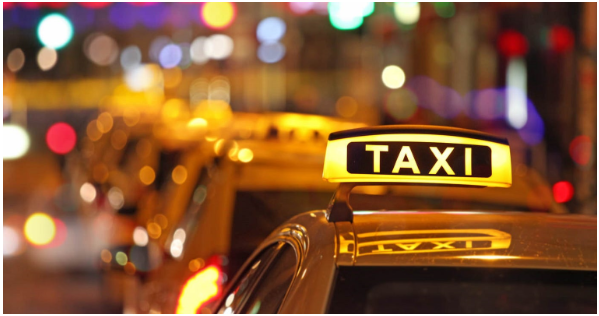

## Learning Objectives

* Clean data in Pandas
* Descriptive analytics amd explanatory analysis: 
    * grouping data
    * visualization via box plots, scatter plots, histograms, and heat maps
* Predictive analytics using regression
* Derive insights from a business analytics point of view

## Case Background

A Chicago taxi company has hired your small accounting and consulting firm to help them save costs and increase revenues. Like many traditional cab companies, Yellow Cab is feeling significant pressure from ride-hailing companies like Lyft and Uber. 

The Chicago Taxi company client tells you: "I heard that you have some data analytics skills. I would like you to see if you there is any data out there that might help us learn more about the situation taxis are in and if there are any interesting revenue opportunities out there that we have not thought of. Where should we be focusing their efforts?"

The city of Chicago puts a bunch of data out there about cab trips. This is just what you need!
 
You may find more information about the data here: https://data.cityofchicago.org/Transportation/Taxi-Trips/wrvz-psew 


Data explanation: Taxi trips reported to the City of Chicago in its role as a regulatory agency. To protect privacy but allow for aggregate analyses, the Taxi ID is consistent for any given taxi medallion number but does not show the number, Census Tracts are suppressed in some cases, and times are rounded to the nearest 15 minutes.

## Load Relevant Packages and Dependencies

Set up the environment, load packages and dependencies.

In [1]:
import pandas as pd 
import numpy as np 
import seaborn as sns
import matplotlib.pyplot as plt
import folium
from folium.plugins import HeatMap
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
# to show graphs inline
%matplotlib inline

In [2]:
file = 'Taxi_Trips_october.csv'
# Load data for use
df = pd.read_csv(file)

In [3]:
df.head()

,Trip ID,Taxi ID,Trip Start Timestamp,Trip End Timestamp,Trip Seconds,Trip Miles,Pickup Census Tract,Dropoff Census Tract,Pickup Community Area,Dropoff Community Area,...,Trip Total,Payment Type,Company,Pickup Centroid Latitude,Pickup Centroid Longitude,Pickup Centroid Location,Dropoff Centroid Latitude,Dropoff Centroid Longitude,Dropoff Centroid Location,Community Areas
0,fec0bcfe5f07e87025658c16baabc2b80532b8e5,d72104d59ef45d3ecb85925a234e9366c59ab32d9751d1...,11/01/2023 12:00:00 AM,11/01/2023 11:30:00 AM,41490.0,17.39,NaN,NaN,76.0,2.0,...,70.25,Cash,City Service,41.980264,-87.913625,POINT (-87.913624596 41.9802643146),42.001571,-87.695013,POINT (-87.6950125892 42.001571027),75.0
1,f2ac00055859e815cd07f95f7cd51b70cb0a079e,3b443d58fee461cd803cdf9a032f474964aabb042fc5f6...,11/01/2023 12:00:00 AM,11/01/2023 12:45:00 AM,2964.0,37.24,NaN,NaN,76.0,76.0,...,92.25,Cash,City Service,41.980264,-87.913625,POINT (-87.913624596 41.9802643146),41.980264,-87.913625,POINT (-87.913624596 41.9802643146),75.0
2,e99f9b320b01baacf3fe76f1b1ddedfa6415789a,c57508f365f1bdac3be5e7de12fb19c8d669c37d515e41...,11/01/2023 12:00:00 AM,11/01/2023 12:30:00 AM,1918.0,14.37,1.703198e+10,NaN,76.0,NaN,...,73.75,Credit Card,5 Star Taxi,41.979071,-87.903040,POINT (-87.9030396611 41.9790708201),NaN,NaN,NaN,75.0
3,e27bb55058db7e31b9abe9f561ca1f83463b9c50,04b96cbbdcfe5b7cbb6884bc1b922819466f652662ead8...,11/01/2023 12:00:00 AM,11/01/2023 12:15:00 AM,1547.0,13.67,NaN,NaN,13.0,5.0,...,47.40,Mobile,5 Star Taxi,41.983636,-87.723583,POINT (-87.7235831853 41.9836363072),41.947792,-87.683835,POINT (-87.6838349425 41.9477915865),13.0
4,dd4e82f678682c3e92897d44dfb5e917d3e8d245,78893d83a12762723e5a8ef770b3fb541e9b2cd8d4316d...,11/01/2023 12:00:00 AM,11/01/2023 12:15:00 AM,1140.0,11.80,NaN,NaN,7.0,69.0,...,30.00,Unknown,Choice Taxi Association,41.922686,-87.649489,POINT (-87.6494887289 41.9226862843),41.763247,-87.616134,POINT (-87.6161341112 41.7632467988),68.0


In [4]:
df.describe()

,Trip Seconds,Trip Miles,Pickup Census Tract,Dropoff Census Tract,Pickup Community Area,Dropoff Community Area,Fare,Tips,Tolls,Extras,Trip Total,Pickup Centroid Latitude,Pickup Centroid Longitude,Dropoff Centroid Latitude,Dropoff Centroid Longitude,Community Areas
count,590892.000000,591019.000000,2.866630e+05,2.773170e+05,575039.000000,534743.000000,589494.00000,589494.000000,589494.000000,589494.000000,589494.000000,575248.000000,575248.000000,538739.000000,538739.000000,575247.000000
mean,1313.535687,6.880794,1.703152e+10,1.703143e+10,36.989555,27.057602,23.58307,3.309476,0.074868,2.433026,29.603999,41.903586,-87.706812,41.894780,-87.665944,46.562956
std,1700.542449,7.793652,3.764646e+05,3.501493e+05,26.520817,21.498117,25.26653,4.521516,14.045815,22.760640,42.969900,0.062897,0.117334,0.056310,0.079130,19.480072
min,0.000000,0.000000,1.703101e+10,1.703101e+10,1.000000,1.000000,0.00000,0.000000,0.000000,0.000000,0.000000,41.650222,-87.913625,41.660136,-87.913625,1.000000
25%,485.000000,0.970000,1.703108e+10,1.703108e+10,8.000000,8.000000,8.50000,0.000000,0.000000,0.000000,10.700000,41.878866,-87.769615,41.878866,-87.663518,37.000000
50%,1002.000000,3.100000,1.703132e+10,1.703132e+10,32.000000,28.000000,17.00000,2.000000,0.000000,0.000000,20.590000,41.895033,-87.642649,41.892073,-87.633308,38.000000
75%,1886.000000,12.560000,1.703198e+10,1.703184e+10,73.000000,32.000000,37.50000,5.000000,0.000000,4.000000,47.600000,41.979071,-87.625192,41.922686,-87.624135,73.000000
max,86230.000000,913.100000,1.703198e+10,1.703198e+10,77.000000,77.000000,9666.66000,400.000000,5555.550000,7760.470000,9666.660000,42.016046,-87.534903,42.015934,-87.534903,77.000000


In [5]:
df.columns

Index(['Trip ID', 'Taxi ID', 'Trip Start Timestamp', 'Trip End Timestamp',
       'Trip Seconds', 'Trip Miles', 'Pickup Census Tract',
       'Dropoff Census Tract', 'Pickup Community Area',
       'Dropoff Community Area', 'Fare', 'Tips', 'Tolls', 'Extras',
       'Trip Total', 'Payment Type', 'Company', 'Pickup Centroid Latitude',
       'Pickup Centroid Longitude', 'Pickup Centroid Location',
       'Dropoff Centroid Latitude', 'Dropoff Centroid Longitude',
       'Dropoff Centroid  Location', 'Community Areas'],
      dtype='object')

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 591022 entries, 0 to 591021
Data columns (total 24 columns):
 #   Column                      Non-Null Count   Dtype  
---  ------                      --------------   -----  
 0   Trip ID                     591022 non-null  object 
 1   Taxi ID                     591022 non-null  object 
 2   Trip Start Timestamp        591022 non-null  object 
 3   Trip End Timestamp          591017 non-null  object 
 4   Trip Seconds                590892 non-null  float64
 5   Trip Miles                  591019 non-null  float64
 6   Pickup Census Tract         286663 non-null  float64
 7   Dropoff Census Tract        277317 non-null  float64
 8   Pickup Community Area       575039 non-null  float64
 9   Dropoff Community Area      534743 non-null  float64
 10  Fare                        589494 non-null  float64
 11  Tips                        589494 non-null  float64
 12  Tolls                       589494 non-null  float64
 13  Extras        

## 1. Clean Data


Perform some data operations on the dataframe such that unreasonable trip rows are eliminated.
- Delete trips with NaN mileage and NaN seconds.
- Delete trips with no cost, since these are mistakes or uninteresting cases
- Delete trips with no mileage but starting and stopping in a different community, since these are likely mistakes.
- Delete trips with no seconds but starting and stopping in a different community, since these are likely mistakes.

In [7]:
#Drop rows with NaN mileage and NaN seconds
df = df.dropna(subset=['Trip Miles', 'Trip Seconds'])

# Remove rows where 'Fare' or 'Trip Total' is 0 or NaN
df = df[(df['Fare'] > 0) | (df['Trip Total'] > 0)]

# Drop trips with no mileage but starting and stopping in a different community
df = df[~((df['Trip Miles'] == 0) & (df['Pickup Community Area'] != df['Dropoff Community Area']))]

# trips with no seconds but starting and stopping in a different community
df = df[~((df['Trip Seconds'] == 0) & (df['Pickup Community Area'] != df['Dropoff Community Area']))]

df.head()

,Trip ID,Taxi ID,Trip Start Timestamp,Trip End Timestamp,Trip Seconds,Trip Miles,Pickup Census Tract,Dropoff Census Tract,Pickup Community Area,Dropoff Community Area,...,Trip Total,Payment Type,Company,Pickup Centroid Latitude,Pickup Centroid Longitude,Pickup Centroid Location,Dropoff Centroid Latitude,Dropoff Centroid Longitude,Dropoff Centroid Location,Community Areas
0,fec0bcfe5f07e87025658c16baabc2b80532b8e5,d72104d59ef45d3ecb85925a234e9366c59ab32d9751d1...,11/01/2023 12:00:00 AM,11/01/2023 11:30:00 AM,41490.0,17.39,NaN,NaN,76.0,2.0,...,70.25,Cash,City Service,41.980264,-87.913625,POINT (-87.913624596 41.9802643146),42.001571,-87.695013,POINT (-87.6950125892 42.001571027),75.0
1,f2ac00055859e815cd07f95f7cd51b70cb0a079e,3b443d58fee461cd803cdf9a032f474964aabb042fc5f6...,11/01/2023 12:00:00 AM,11/01/2023 12:45:00 AM,2964.0,37.24,NaN,NaN,76.0,76.0,...,92.25,Cash,City Service,41.980264,-87.913625,POINT (-87.913624596 41.9802643146),41.980264,-87.913625,POINT (-87.913624596 41.9802643146),75.0
2,e99f9b320b01baacf3fe76f1b1ddedfa6415789a,c57508f365f1bdac3be5e7de12fb19c8d669c37d515e41...,11/01/2023 12:00:00 AM,11/01/2023 12:30:00 AM,1918.0,14.37,1.703198e+10,NaN,76.0,NaN,...,73.75,Credit Card,5 Star Taxi,41.979071,-87.903040,POINT (-87.9030396611 41.9790708201),NaN,NaN,NaN,75.0
3,e27bb55058db7e31b9abe9f561ca1f83463b9c50,04b96cbbdcfe5b7cbb6884bc1b922819466f652662ead8...,11/01/2023 12:00:00 AM,11/01/2023 12:15:00 AM,1547.0,13.67,NaN,NaN,13.0,5.0,...,47.40,Mobile,5 Star Taxi,41.983636,-87.723583,POINT (-87.7235831853 41.9836363072),41.947792,-87.683835,POINT (-87.6838349425 41.9477915865),13.0
4,dd4e82f678682c3e92897d44dfb5e917d3e8d245,78893d83a12762723e5a8ef770b3fb541e9b2cd8d4316d...,11/01/2023 12:00:00 AM,11/01/2023 12:15:00 AM,1140.0,11.80,NaN,NaN,7.0,69.0,...,30.00,Unknown,Choice Taxi Association,41.922686,-87.649489,POINT (-87.6494887289 41.9226862843),41.763247,-87.616134,POINT (-87.6161341112 41.7632467988),68.0


### Fix datetime

Create a new column that converts `trip_start_timestamp` and `trip_end_timestamp` to a datetime object. Create two new columns - for the  day and hour, use the start of the trip, since that is something the taxi driver can control)

In [8]:
# Convert 'Trip Start Timestamp' and 'Trip End Timestamp' to datetime objects
df['Trip Start Timestamp'] = pd.to_datetime(df['Trip Start Timestamp'], format='%m/%d/%Y %I:%M:%S %p')
df['Trip End Timestamp'] = pd.to_datetime(df['Trip End Timestamp'], format='%m/%d/%Y %I:%M:%S %p')

# Create new columns for the day and hour of the trip start
df['Start Day'] = df['Trip Start Timestamp'].dt.day_name()
df['Start Hour'] = df['Trip Start Timestamp'].dt.hour

# Display the DataFrame to verify the changes
df[['Trip Start Timestamp', 'Trip End Timestamp', 'Start Day', 'Start Hour']]

,Trip Start Timestamp,Trip End Timestamp,Start Day,Start Hour
0,2023-11-01 00:00:00,2023-11-01 11:30:00,Wednesday,0
1,2023-11-01 00:00:00,2023-11-01 00:45:00,Wednesday,0
2,2023-11-01 00:00:00,2023-11-01 00:30:00,Wednesday,0
3,2023-11-01 00:00:00,2023-11-01 00:15:00,Wednesday,0
4,2023-11-01 00:00:00,2023-11-01 00:15:00,Wednesday,0
...,...,...,...,...
591017,2023-10-01 23:45:00,2023-10-02 00:00:00,Sunday,23
591018,2023-10-01 23:45:00,2023-10-02 00:15:00,Sunday,23
591019,2023-10-01 23:45:00,2023-10-01 23:45:00,Sunday,23
591020,2023-10-01 23:45:00,2023-10-01 23:45:00,Sunday,23


### Deal with outliers

The main focus in outliers is getting `trip_total` right, since you are trying to understand how a company can make money. `trip_seconds` and `trip_duration` also have outliers, which you should look at, but we will focus on `trip_total` and `tips`.

First, draw box plots of those four variables to see how significant the outlier situation is

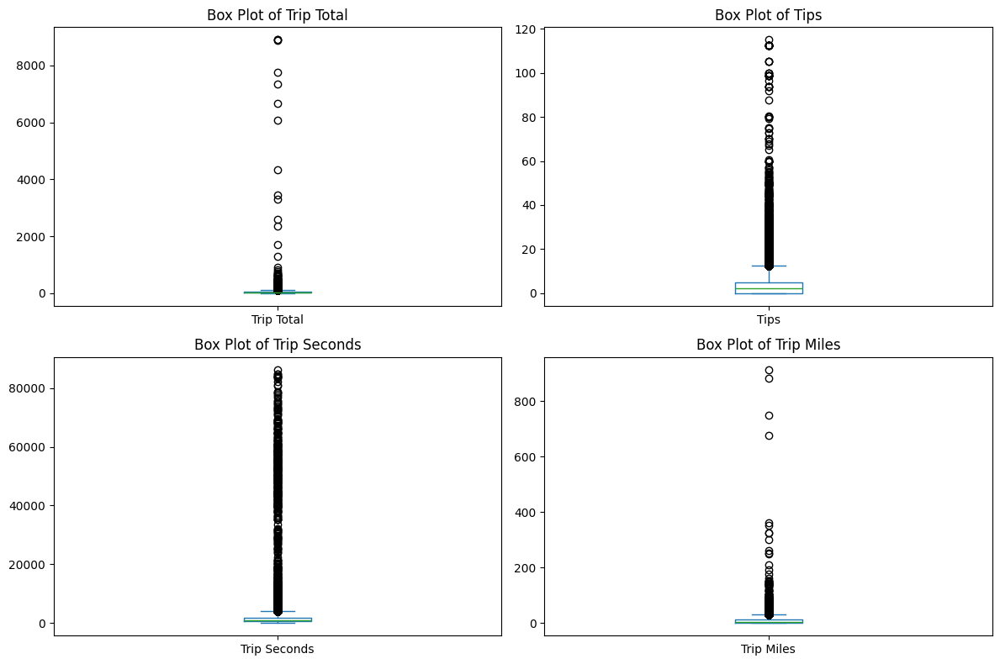

In [9]:
plt.figure(figsize=(12, 8))

# Box plot for 'Trip Total'
plt.subplot(2, 2, 1)
df['Trip Total'].plot(kind='box')
plt.title('Box Plot of Trip Total')

# Box plot for 'Tips'
plt.subplot(2, 2, 2)
df['Tips'].plot(kind='box')
plt.title('Box Plot of Tips')

# Box plot for 'Trip Seconds'
plt.subplot(2, 2, 3)
df['Trip Seconds'].plot(kind='box')
plt.title('Box Plot of Trip Seconds')

# Box plot for 'Trip Miles'
plt.subplot(2, 2, 4)
df['Trip Miles'].plot(kind='box')
plt.title('Box Plot of Trip Miles')

plt.tight_layout()
plt.show()

## Observations:

**Trip Total:** 
The majority of the data for 'Trip Total' is concentrated at the lower end of the scale, with a median close to zero. There is a significant spread in the upper range with many outliers, indicating that there are trips with unusually high total costs. long trips.

**Tips:**
Similar to 'Trip Total', 'Tips' also has many outliers, with most tips being on the lower end. The median tip is also close to the lower end, suggesting that tipping is not consistent across all trips.

**Trip Seconds:**
'Trip Seconds' shows a tight interquartile range, but again, there are many outliers indicating trips that are much longer than the average. The distribution suggests that most trips are of moderate length.

**Trip Miles:**
The box plot for 'Trip Miles' indicates that most trips are short, with a few outliers representing very long trips.

Next, draw two scatter plots to see how cost and miles and cost and seconds relate to each other.

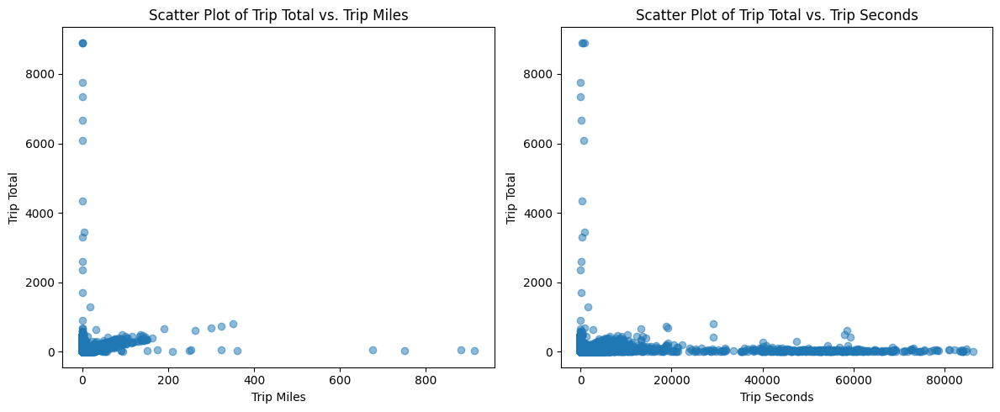

In [10]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.scatter(df['Trip Miles'], df['Trip Total'], alpha=0.5)
plt.title('Scatter Plot of Trip Total vs. Trip Miles')
plt.xlabel('Trip Miles')
plt.ylabel('Trip Total')

# Scatter plot to see how 'Trip Total' (cost) relates to 'Trip Seconds'
plt.subplot(1, 2, 2)
plt.scatter(df['Trip Seconds'], df['Trip Total'], alpha=0.5)
plt.title('Scatter Plot of Trip Total vs. Trip Seconds')
plt.xlabel('Trip Seconds')
plt.ylabel('Trip Total')

plt.tight_layout()
plt.show()

Question: <br>
These plots indicate that most very high cost trips are probably errors or uninteresting since they have took very few seconds and went very few miles. For example, it does not seem plausible that a $8,000 cab fare took went about 0 miles and took about 0 seconds. 

Let's correct this by eliminating rows with unusually high dollars (i.e., trip with unreasonably low seconds or low mileage but high payment).

In [11]:
# Calculate Q1, Q3 and IQR
Q1 = df['Trip Total'].quantile(0.25)
Q3 = df['Trip Total'].quantile(0.75)
IQR = Q3 - Q1

# Define boundaries for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filter out outliers based on IQR
df_filtered = df[(df['Trip Total'] >= lower_bound) & (df['Trip Total'] <= upper_bound)]
df_filtered.head()

,Trip ID,Taxi ID,Trip Start Timestamp,Trip End Timestamp,Trip Seconds,Trip Miles,Pickup Census Tract,Dropoff Census Tract,Pickup Community Area,Dropoff Community Area,...,Company,Pickup Centroid Latitude,Pickup Centroid Longitude,Pickup Centroid Location,Dropoff Centroid Latitude,Dropoff Centroid Longitude,Dropoff Centroid Location,Community Areas,Start Day,Start Hour
0,fec0bcfe5f07e87025658c16baabc2b80532b8e5,d72104d59ef45d3ecb85925a234e9366c59ab32d9751d1...,2023-11-01,2023-11-01 11:30:00,41490.0,17.39,NaN,NaN,76.0,2.0,...,City Service,41.980264,-87.913625,POINT (-87.913624596 41.9802643146),42.001571,-87.695013,POINT (-87.6950125892 42.001571027),75.0,Wednesday,0
1,f2ac00055859e815cd07f95f7cd51b70cb0a079e,3b443d58fee461cd803cdf9a032f474964aabb042fc5f6...,2023-11-01,2023-11-01 00:45:00,2964.0,37.24,NaN,NaN,76.0,76.0,...,City Service,41.980264,-87.913625,POINT (-87.913624596 41.9802643146),41.980264,-87.913625,POINT (-87.913624596 41.9802643146),75.0,Wednesday,0
2,e99f9b320b01baacf3fe76f1b1ddedfa6415789a,c57508f365f1bdac3be5e7de12fb19c8d669c37d515e41...,2023-11-01,2023-11-01 00:30:00,1918.0,14.37,1.703198e+10,NaN,76.0,NaN,...,5 Star Taxi,41.979071,-87.903040,POINT (-87.9030396611 41.9790708201),NaN,NaN,NaN,75.0,Wednesday,0
3,e27bb55058db7e31b9abe9f561ca1f83463b9c50,04b96cbbdcfe5b7cbb6884bc1b922819466f652662ead8...,2023-11-01,2023-11-01 00:15:00,1547.0,13.67,NaN,NaN,13.0,5.0,...,5 Star Taxi,41.983636,-87.723583,POINT (-87.7235831853 41.9836363072),41.947792,-87.683835,POINT (-87.6838349425 41.9477915865),13.0,Wednesday,0
4,dd4e82f678682c3e92897d44dfb5e917d3e8d245,78893d83a12762723e5a8ef770b3fb541e9b2cd8d4316d...,2023-11-01,2023-11-01 00:15:00,1140.0,11.80,NaN,NaN,7.0,69.0,...,Choice Taxi Association,41.922686,-87.649489,POINT (-87.6494887289 41.9226862843),41.763247,-87.616134,POINT (-87.6161341112 41.7632467988),68.0,Wednesday,0


Next, rerun the two scatterplots from above to visually inspect whether this worked. 

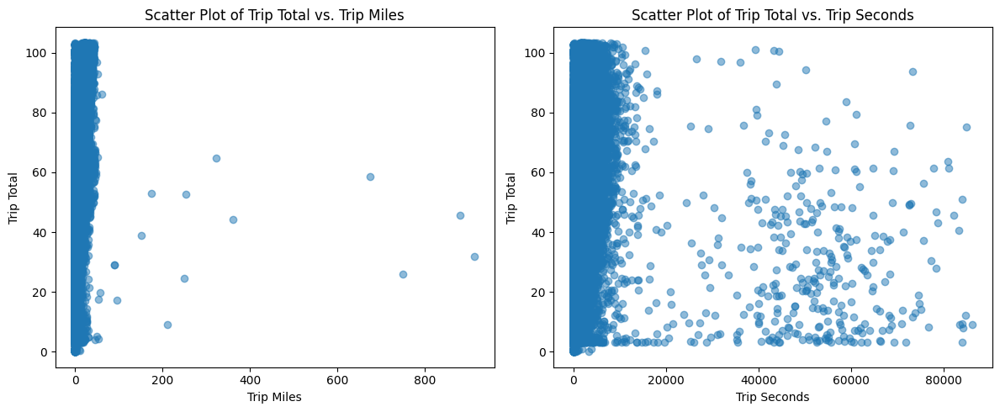

In [12]:
plt.figure(figsize=(12, 5))

# Scatter plot to see how 'Trip Total' (cost) relates to 'Trip Miles'
plt.subplot(1, 2, 1)
plt.scatter(df_filtered['Trip Miles'], df_filtered['Trip Total'], alpha=0.5)
plt.title('Scatter Plot of Trip Total vs. Trip Miles')
plt.xlabel('Trip Miles')
plt.ylabel('Trip Total')

# Scatter plot to see how 'Trip Total' (cost) relates to 'Trip Seconds'
plt.subplot(1, 2, 2)
plt.scatter(df_filtered['Trip Seconds'], df_filtered['Trip Total'], alpha=0.5)
plt.title('Scatter Plot of Trip Total vs. Trip Seconds')
plt.xlabel('Trip Seconds')
plt.ylabel('Trip Total')

plt.tight_layout()
plt.show()

**Trip Total vs. Trip Miles:** 
The scatter plot now appears to show a denser cluster of points along the lower range of both 'Trip Miles' and 'Trip Total', which suggests that removing the extreme outliers has made the typical trip costs and distances more apparent.
There are still some trips with higher costs relative to the distance, but these do not appear as extreme as befotrips.

**Trip Total vs. Trip Seconds:**
Similarly, the second scatter plot shows a concentration of points at the lower end of both axes. The relationship between trip duration and cost seems more consistent, with fewer anomalous high-cost, short-duration trips.

In both plots, the existence of trips with high total costs regardless of the low miles or seconds could point to minimum charges, fixed fares to certain destinations, or other pricing factors independent of distance and time like waiting time, cancellation fees, fees for services like airport surcharges, luggage assistance, or having additional passengers.

## 2. Descriptive Analytics

Next, explore the data using descriptive analytics. Graph the number of trips by day of the week, and by hour of the day. 


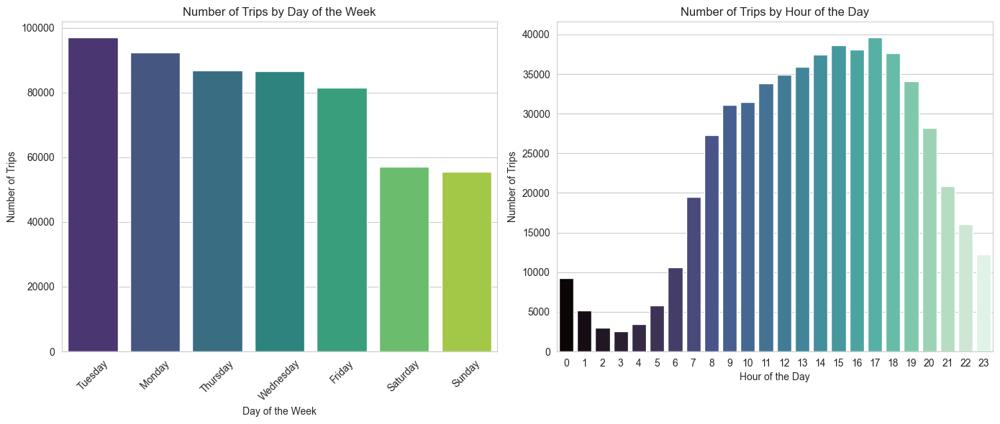

In [13]:
sns.set_style("whitegrid")

# Count the number of trips by day of the week
trips_by_day = df_filtered['Start Day'].value_counts()

# Count the number of trips by hour of the day
trips_by_hour = df_filtered['Start Hour'].value_counts().sort_index()

plt.figure(figsize=(14, 6))

# Plot the number of trips by day of the week
plt.subplot(1, 2, 1)
sns.barplot(x=trips_by_day.index, y=trips_by_day.values, palette="viridis", hue=trips_by_day.index, legend=False)
plt.title('Number of Trips by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Number of Trips')
plt.xticks(rotation=45)

# Plot the number of trips by hour of the day
plt.subplot(1, 2, 2)
sns.barplot(x=trips_by_hour.index, y=trips_by_hour.values, palette="mako", hue=trips_by_hour.index, legend=False)
plt.title('Number of Trips by Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Number of Trips')

plt.tight_layout()
plt.show()

**Number of Trips by Day of the Week:** 
There's a clear pattern of the number of trips taken on different days of the week. The chart typically shows a decrease in the number of trips during the weekend compared to weekdays, with the lowest number usually seen on Sundays.

**Number of Trips by Hour of the Day:** The number of trips increases steadily throughout the morning, peaks during the evening hours, and then gradually decreases towards late night. There is a noticeable dip in the early hours of the morning, which is expected due to fewer people traveling at those times.

#### Costs and tips by pick-up community area

Graph on a histogram the top 20 community areas to pick up in if you want to maximize total cost and tips. Thus, two graphs are required. Can you draw any useful conclusions from this analysis?

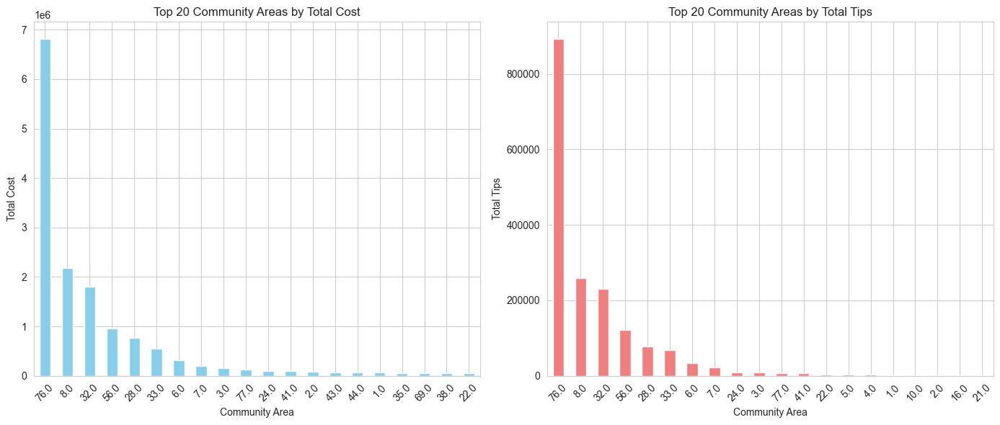

In [14]:
# Group the data by pick-up community area and calculate total cost and tips
pickup_costs = df_filtered.groupby('Pickup Community Area')['Trip Total'].sum()
pickup_tips = df_filtered.groupby('Pickup Community Area')['Tips'].sum()

# Sort the community areas by total cost and total tips
top_pickup_costs = pickup_costs.sort_values(ascending=False).head(20)
top_pickup_tips = pickup_tips.sort_values(ascending=False).head(20)

# Create histograms for the top 20 community areas for total cost and tips
plt.figure(figsize=(14, 6))

# Histogram for top 20 community areas by total cost
plt.subplot(1, 2, 1)
top_pickup_costs.plot(kind='bar', color='skyblue')
plt.title('Top 20 Community Areas by Total Cost')
plt.xlabel('Community Area')
plt.ylabel('Total Cost')
plt.xticks(rotation=45)

# Histogram for top 20 community areas by total tips
plt.subplot(1, 2, 2)
top_pickup_tips.plot(kind='bar', color='lightcoral')
plt.title('Top 20 Community Areas by Total Tips')
plt.xlabel('Community Area')
plt.ylabel('Total Tips')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

## Conclusions

**Disparity in Revenue Across Communities:** There's a significant variation in total cost and tips among the top community areas. Some areas contribute substantially more to the total revenue than others. 

**Community Area 76, O'Hare Airport**, stands out as a significant revenue generator for taxi services in Chicago. It exhibits substantially higher total costs and tips compared to other areas, attributable to its role as a major travel hub. Airport trips often involve longer distances and can command higher fares, including flat rates that contribute to increased earnings. Passengers, including a higher proportion of business travelers, may also be inclined to offer larger tips, especially when service includes assistance with luggage or navigating to terminals. 

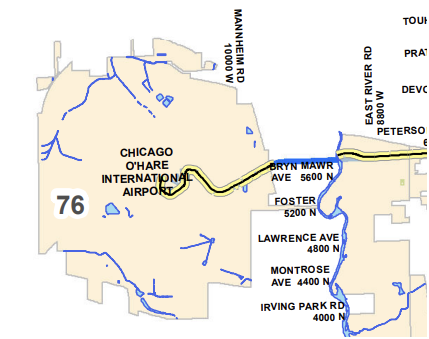

#### Costs and tips by means of payment

Graph the mean of the total cost and tips by type of payment. Thus, two graphs are required. Can you draw any useful conclusions from this analysis?

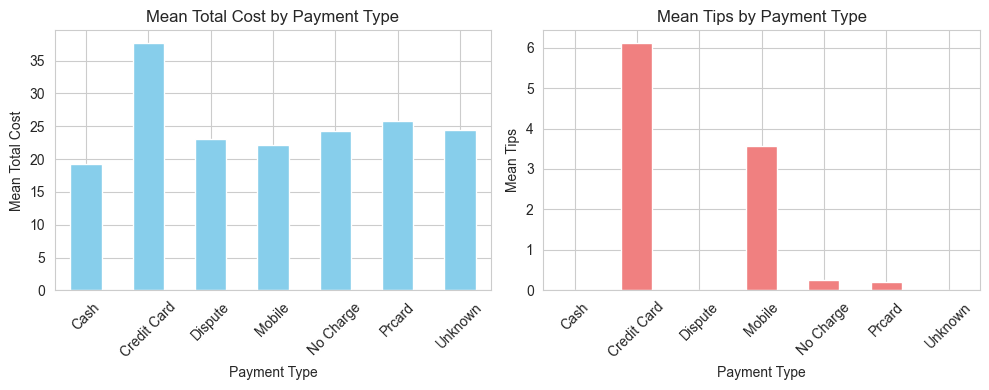

In [15]:
# Group the data by payment type and calculate mean total cost and tips
payment_means = df_filtered.groupby('Payment Type')[['Trip Total', 'Tips']].mean()

# Create two bar graphs for mean total cost and tips by payment type
plt.figure(figsize=(10, 4))

# Bar graph for mean total cost by payment type
plt.subplot(1, 2, 1)
payment_means['Trip Total'].plot(kind='bar', color='skyblue')
plt.title('Mean Total Cost by Payment Type')
plt.xlabel('Payment Type')
plt.ylabel('Mean Total Cost')
plt.xticks(rotation=45)

# Bar graph for mean tips by payment type
plt.subplot(1, 2, 2)
payment_means['Tips'].plot(kind='bar', color='lightcoral')
plt.title('Mean Tips by Payment Type')
plt.xlabel('Payment Type')
plt.ylabel('Mean Tips')
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

## Conclusions:

**Mean Total Cost by Payment Type:** Credit card payments appear to have a higher mean total cost compared to cash and other payment methods. This could be due to the convenience and security that credit cards offer, which might encourage passengers to use them for longer or more expensive trips.

**Mean Tips by Payment Type:** Given that cash tips are generally not recorded in the dataset, the analysis of tips by payment type indicates that the tips associated with electronic payments (credit cards and mobile payments) are likely to be more accurately represented in the data. This suggests that while electronic payment methods show higher tips on record, it may not necessarily reflect a true difference in tipping behavior since cash tips go unrecorded. Thus, the conclusions drawn from such data should be carefully considered, acknowledging that the actual amount of cash tips could be comparable or even exceed those made electronically but are simply not captured in the dataset

*Dataset description note:*
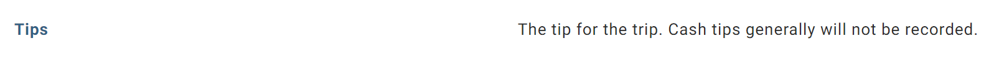

#### Visualizing tips and total bill by location

Next, explore some of the geographical characteristics of the data. Graph the data based upon latitude and longitude. Use the pick-up location, since this is something the driver can control. Use built in features of a Python package (e.g., pyplot from matplotlib) to also see the total bill and the tip amount on this graph. (Hint: outliers will skew the graph, look at trips under $50.) What conclusions can be drawn from this analysis?

**Extra**: If you are really advanced python user, you can try to overlay a Chicago city map and build a nice visualization tool

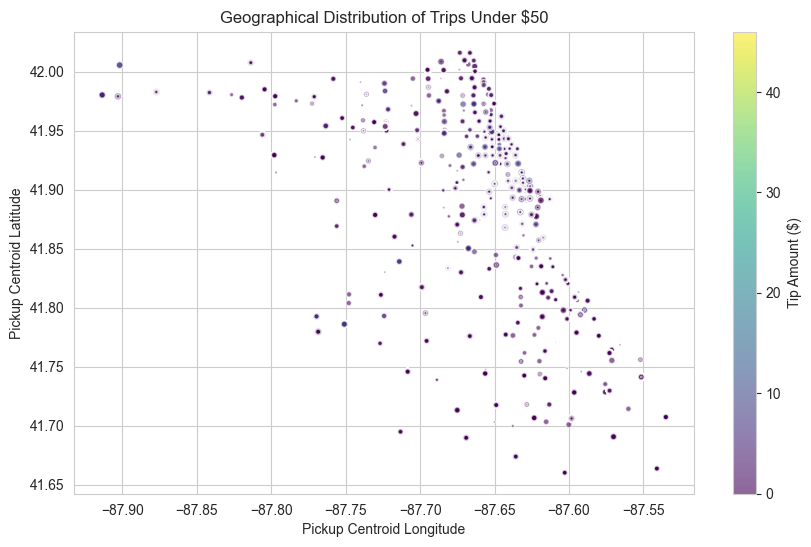

In [16]:
# Filter for trips under $50 to avoid skewing the graph with outliers
df_geo = df_filtered[df_filtered['Trip Total'] < 50]

# Create the scatter plot
plt.figure(figsize=(10, 6))

# Use the 'Trip Total' for the size of the scatter plot points (scaled down for better visibility)
# and 'Tips' for the color to indicate tip amounts.
plt.scatter(df_geo['Pickup Centroid Longitude'], df_geo['Pickup Centroid Latitude'],
            s=df_geo['Trip Total']/2,  # Size divided by 2 for better visibility
            c=df_geo['Tips'],  # Color by tip amount
            cmap='viridis', alpha=0.6, edgecolor='w')

plt.colorbar(label='Tip Amount ($)')  # Show color scale
plt.title('Geographical Distribution of Trips Under $50')
plt.xlabel('Pickup Centroid Longitude')
plt.ylabel('Pickup Centroid Latitude')

plt.show()

In [17]:
# Ensure df_filtered is your DataFrame with trips under $50 and without NaN values in the location columns
df_geo = df_filtered[(df_filtered['Trip Total'] < 50) & 
                     df_filtered['Pickup Centroid Latitude'].notna() & 
                     df_filtered['Pickup Centroid Longitude'].notna()]

# Initialize the map centered around Chicago
chicago_map = folium.Map(location=[41.8781, -87.6298], zoom_start=11)

# Create a HeatMap layer for trip pickups
heat_data = [[row['Pickup Centroid Latitude'], row['Pickup Centroid Longitude']] for index, row in df_geo.iterrows()]
HeatMap(heat_data).add_to(chicago_map)

chicago_map

## Observations

**Concentration of Trips:**
There appears to be clusters of activity in certain areas, likely corresponding to popular pick-up locations such as downtown, near transit hubs, or areas with a high density of attractions and businesses.

**Tip Variation:** The color variation indicates that tips are not uniformly distributed geographically. There could be areas where higher tips are more common, which might correlate with wealthier neighborhoods or business districts where passengers might be more inclined to tip more generously.

**Note:** It's crucial to acknowledge the limitation regarding cash tip recording. Cash tips, which could constitute a significant portion of tips, are missing from the dataset, leading to an underestimation of the total tips drivers actually receive.

**Geographical Insights:** The spread of the data points across the longitude and latitude coordinates shows that taxi trips are not confined to a single part of the city but occur throughout a wide area. This could indicate a citywide service area or diverse passenger needs.

## 3. Predictive Analytics - Regression
----------

### Two Basic Regressions

With data points available for certain values, we can build a more general predictive model using linear regression ($y = A_0x_+\epsilon$). A linear regression model makes a few key assumptions:

- Features are linearly independent of each other.
- Errors in the regression are normally distributed (rather than biased).
- Effects are linear functions of inputs.


The model $y$ is an effect or response produced by the features, the predictors, or the values (all meaning more or less the same thing to us). If only one feature $x_1$ is used, this is a simple linear regression; if more than one feature is used, as above, then this is a multiple linear regression.

Linear regression is actually implemented several times in Python libraries


Use regression to examine the factors that are predictive of the total bill and tips. What does this analysis tell you?

## Total bill prediction

In [18]:
X = df_filtered[['Trip Seconds', 'Trip Miles', 'Pickup Community Area', 'Fare']]  # Independent variables
y = df_filtered['Trip Total']  # Dependent variable (Total bill)

X = X.dropna()
y = y[X.index]  # Make sure to align y with the cleaned X

# Check correlations between variables
correlations = df_filtered[['Trip Seconds', 'Trip Miles', 'Pickup Community Area', 'Fare', 'Trip Total']].corr()
correlations

,Trip Seconds,Trip Miles,Pickup Community Area,Fare,Trip Total
Trip Seconds,1.000000,0.449874,0.258890,0.479282,0.448014
Trip Miles,0.449874,1.000000,0.496258,0.810101,0.792703
Pickup Community Area,0.258890,0.496258,1.000000,0.532641,0.592388
Fare,0.479282,0.810101,0.532641,1.000000,0.949142
Trip Total,0.448014,0.792703,0.592388,0.949142,1.000000


**Overall Insights:**
'Trip Miles' and 'Fare' show the strongest positive correlation, which is a logical finding for taxi trip data. It indicates that the fare is most strongly influenced by the distance of the trip. Correlations involving 'Pickup Community Area' suggest that where a trip starts can have a moderate impact on both the duration and distance of the trip, as well as the fare. However, it's important to remember that correlation does not imply causation, and these relationships may be influenced by other unconsidered factors.s.

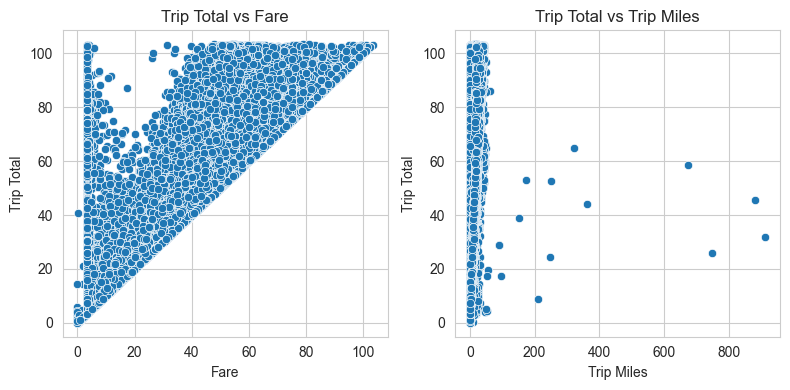

In [19]:
# Plotting the relationship between Fare and Trip Total
plt.figure(figsize=(8, 4))

plt.subplot(1, 2, 1)  # First subplot
sns.scatterplot(x='Fare', y='Trip Total', data=df_filtered)
plt.title('Trip Total vs Fare')
plt.xlabel('Fare')
plt.ylabel('Trip Total')

# Plotting the relationship between Trip Miles and Trip Total
plt.subplot(1, 2, 2)  # Second subplot
sns.scatterplot(x='Trip Miles', y='Trip Total', data=df_filtered)
plt.title('Trip Total vs Trip Miles')
plt.xlabel('Trip Miles')
plt.ylabel('Trip Total')

plt.tight_layout()
plt.show()

## Interpretation

From these plots, we can conclude that fare is a strong predictor of the total cost of the trip, which aligns with the regression analysis. The relationship between miles traveled and total cost appears to be less strong, possibly because there are other factors that influence the total cost, such as base charges, waiting time, and additional fees that are not strictly dependent on the distance traveled.

The plots also suggest that there might be a flat rate for certain trips (as indicated by the vertical clustering of points at lower mileages) and that outliers in the data could represent special cases like long-distance trips or trips with unusually high additional charges.

## Tips prediction

In [20]:
X = df_filtered[['Trip Seconds', 'Trip Miles', 'Pickup Community Area', 'Fare']]  # Independent variables
y = df_filtered['Tips']  # Dependent variable (Total bill)

# Dropping any rows with missing values to ensure clean data for regression
X_clean = X.dropna()
y_clean = y.loc[X_clean.index]

# Check correlations between variables
correlations = df_filtered[['Trip Seconds', 'Trip Miles', 'Pickup Community Area', 'Fare', 'Tips']].corr()
correlations

,Trip Seconds,Trip Miles,Pickup Community Area,Fare,Tips
Trip Seconds,1.000000,0.449874,0.258890,0.479282,0.248875
Trip Miles,0.449874,1.000000,0.496258,0.810101,0.476253
Pickup Community Area,0.258890,0.496258,1.000000,0.532641,0.417916
Fare,0.479282,0.810101,0.532641,1.000000,0.545769
Tips,0.248875,0.476253,0.417916,0.545769,1.000000


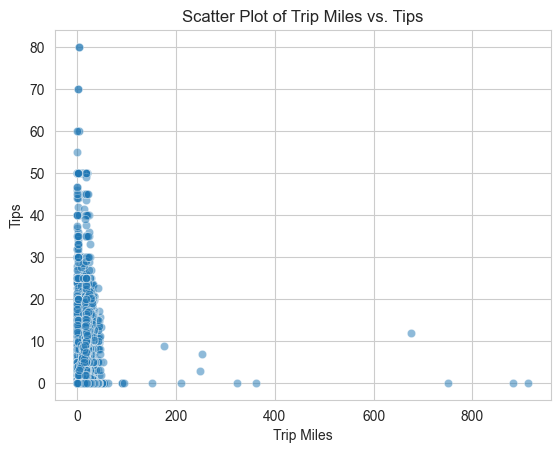

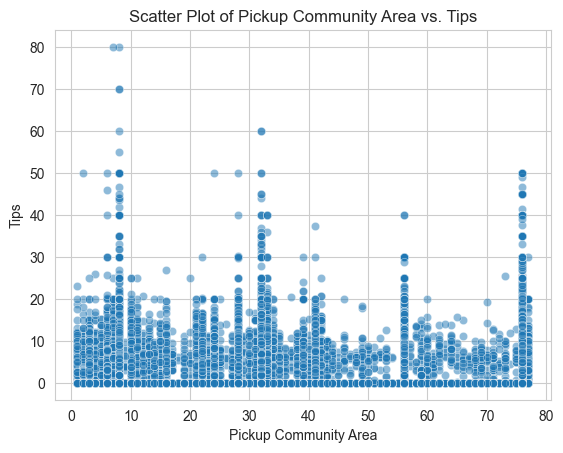

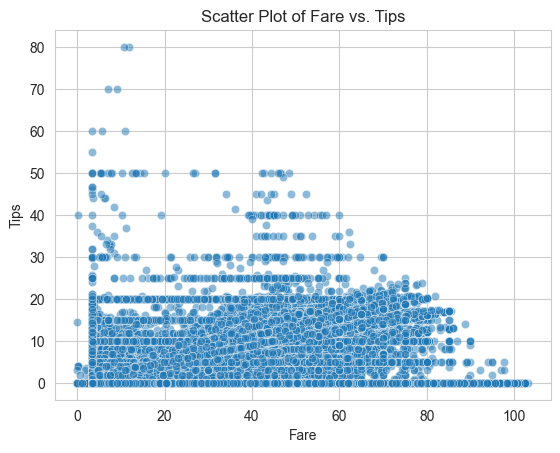

In [21]:
# Select the variables with strong and moderate correlations with 'Tips'
strong_moderate_corr_vars = ['Trip Miles', 'Pickup Community Area', 'Fare']

# Create scatter plots
for var in strong_moderate_corr_vars:
    sns.scatterplot(x=df_filtered[var], y=df_filtered['Tips'], alpha=0.5)
    plt.xlabel(var)
    plt.ylabel('Tips')
    plt.title(f'Scatter Plot of {var} vs. Tips')
    plt.show()

## Interpretation:

The correlation coefficients suggest that there is a moderate positive correlation between 'Tips' and each of the independent variables, with 'Fare' having the strongest correlation.
This indicates that as the values of 'Fare,' 'Trip Miles,' 'Pickup Community Area,' and 'Trip Seconds' increase, the tips received by taxi drivers tend to increase as well, although the relationships are not extremely strong.

## Strategic Recommendations

**Target High Revenue Areas:** 
Direct marketing efforts and driver incentives towards high-revenue community areas, especially around airports and business districts.

**Optimize Shift Scheduling:** Align driver shifts with peak demand times to maximize fare opportunities and improve service availability for passengers.

**Refine the Fare Prediction Model:** Leverage our fare prediction model to inform strategic decision-making and explore dynamic pricing options.

**Enhance Customer Experience:** As tips correlate with customer satisfaction, we recommend initiatives aimed at improving service quality, such as driver training programs focused on customer service excellence.

By implementing these recommendations, Yellow Cab can enhance its competitive position, improve service profitability, and ensure customer satisfaction remains high in a rapidly evolving market.